In [1]:
#import cactusUtils as cu
import numpy
_pi = numpy.pi

import matplotlib.pyplot as plt

from scipy.interpolate import InterpolatedUnivariateSpline as spline
from scipy import special

import scipy

from scipy import ndimage

from pixell import enmap, enplot, reproject, utils, curvedsky 

In [2]:
###Rutinas tomadas de cactusBeams

def getBeamProfile(filename,factorx = None):
    """
    returns the beam profile function from a file containing
    two-columns of theta, Beam_theta.theta in degrees from 0. to approx 1.

    Args:
        filename (str): beam plaintext file containing two-columns of theta,
        Beam_theta. theta in degrees from 0. to approx 1. THE FILE MUST NOT 
        HAVE "nan" VALUES, will check this later.
        factorx (float): factor to multiply the x axis to change the scale
        of the function, for example factorx = 60. gives the function in
        arcmin
    Returns:
        ret (numpy function): interpolated beam
    """
    Bx, By = numpy.loadtxt(filename,usecols=(0,1),unpack=True)
    if factorx is not None:
        Bx = factorx*Bx
    B = spline(Bx,By,k=5,ext=1) #ext=1 means zeros outside
    #B = scipy.interpolate.interp1d(Bx,By)
    return B

def getBeamSpline(beam_ell_file):
    BeamlFl0, BeamlFl1  = numpy.loadtxt(beam_ell_file, usecols=(0,1),unpack=True)
    # Cleaning the file if it has nans
    mask = ~numpy.isnan(BeamlFl1)
    return spline(BeamlFl0[mask], BeamlFl1[mask], ext=1)

def getBeamNorm(Beam):
    """
    gets the central value of a pixelated beam
    """
    return numpy.sum(Beam)/Beam.size

def symmetrizeFFT(fftmatrix):
    frx0 = fftmatrix.real[0, 1:]
    fix0 = fftmatrix.imag[0, 1:]
    fry0 = fftmatrix.real[1:, 0]
    fiy0 = fftmatrix.imag[1:, 0]
    fr11 = fftmatrix.real[1:, 1:]
    fi11 = fftmatrix.imag[1:, 1:]
    out = fftmatrix.copy()
    out[0, 1:] = (frx0 + numpy.flipud(frx0)) / 2. + 1j * (fix0 - numpy.flipud(fix0)) / 2.
    out[1:, 0] = (fry0 + numpy.flipud(fry0)) / 2. + 1j * (fiy0 - numpy.flipud(fiy0)) / 2.
    out[1:, 1:] = (fr11 + numpy.flipud(numpy.fliplr(fr11))) / 2. + 1j * (fi11 - numpy.flipud(numpy.fliplr(fi11))) / 2.
    return out

def SymmetricFourierTransform(fnc, rmax, nbin=10000, inverse=False, ell=True):
    """returns the two-dimensional Fourier transform of a radially symmetric function
    Args:
        fnc python lambda or numpy function to transform
        rmax (int): maximum value to integrate
        nbin  (int): number of bins
        inverse (bool): if true gives the inverse transform
        ell (bool): if true gives fnc in ell, if false in k
    Returns:
    ret (lambda function): transform of fnc
    """
    if inverse:
        sign = -1
        norm = 1./(2.*numpy.pi)
    else:
        sign = -1
        norm = 2.*numpy.pi
    r = numpy.linspace(0.,rmax,nbin)
    #r = numpy.logspace(-10,numpy.log10(rmax),nbin)    
    FNC = fnc(r)
    if ell:
        auxfunc = lambda ell: norm*numpy.trapz(r*FNC*special.j0(sign*r*ell),r)
    else:
        auxfunc = lambda k: norm*numpy.trapz(r*FNC*special.j0(sign*r*2*numpy.pi*k),r)
    sft = lambda x: list(map(auxfunc, numpy.array(x)))
    return sft

def BeamSolidAngle(fnc, nbin = 10000000):
    """
    fnc Beam in radians
    """
    theta = numpy.linspace(0,numpy.pi/180.,nbin)
    FNC = fnc(theta)
    solid_angle = 2*numpy.pi*numpy.trapz(theta*FNC,theta)
    return solid_angle

def Beta(r, theta, beta):
    """evaluates Beta at point

    Args:
        r (float): radius
        theta (float): angle
        beta (float): factor

    Returns:
        ret (float): value

    """
    return (1 + (r/theta)**2)**((1 - 3*beta)/2)

def getBetaFunction(theta, beta):
    """returns beam profile using a beam file

    Args:
        theta (float): angle
        beta (float): factor

    Returns:
        ret (lambda function): beta function

    """
    bf = lambda r: Beta(r, theta, beta)
    return bf



In [3]:
#carpeta donde estan los archivos
path = "/home/cvargas/advact_depot/"
beamfolder = "beams_pa12_2013_2014_160201"

In [4]:
###Beams ###############################################################################################################

#Algunos beams se pueden descargar desde LAMBDA, en general cada mapa tiene un beam distinto en cada año/frecuencia/array
#en algunos casos muy similar, por ejemplo beams del mismo año/frecuencia pero distinto polarimeter array (pa)

#El siguiente link es una coleccion de beams de ACTPol de 2013/2014
#https://lambda.gsfc.nasa.gov/product/act/actpol_beams_get.cfm

#Para trabajar con fuentes (Galaxias o Cumulos) usamos un perfil con corrección de pointing (jitter), estos Beams vienen
#calibrados a la frecuencia central de CMB por lo que debemos hacer un pequeño scaling dependiendo del tipo de fuente
#queremos medir, en este caso pasamos desde CMB a SZ Effect, segun el paper de Thornton 2016 esto es para PA1 desde 
#148.9 a 145.0 (vamos a usar mapas de ACTpol de D56 PA1)

#paper https://iopscience.iop.org/article/10.3847/1538-4365/227/2/21/pdf tabla1

scaling = 148.9/145.0

beam_profile_file = path + beamfolder + "/beam_profile_160201_2014_pa1_jitter_CMB_deep56.txt"

#Los archivos de Beam Profile vienen en grados vs amplitud normalizada a 1.0
#getBeamProfile crea una función continua con estos datos

beam_profile = getBeamProfile(beam_profile_file, factorx = scaling)



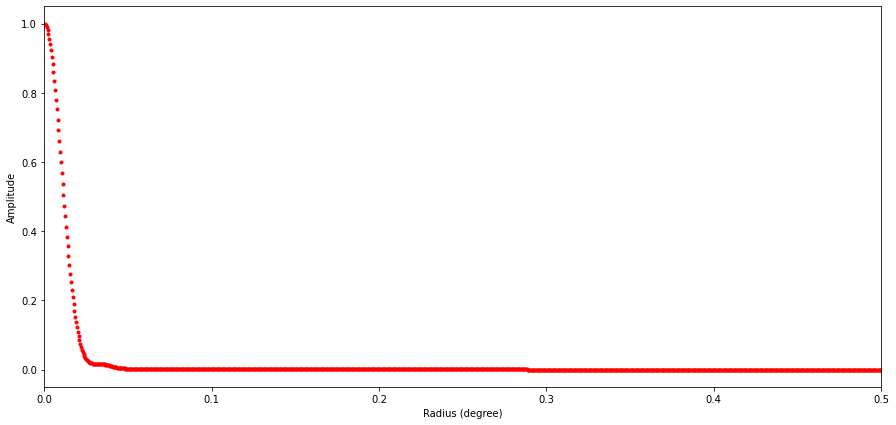

In [5]:
#Plot de Beam pa1 (150GHz)

theta = numpy.linspace(0.,0.5,1000)
beam = beam_profile(theta)

plt.figure(figsize=(15,7))
plt.xlabel("Radius (degree)")
plt.ylabel("Amplitude")
plt.xlim(0.,0.5)
plt.plot(theta,beam,"r.")

(0.0, 3.0)

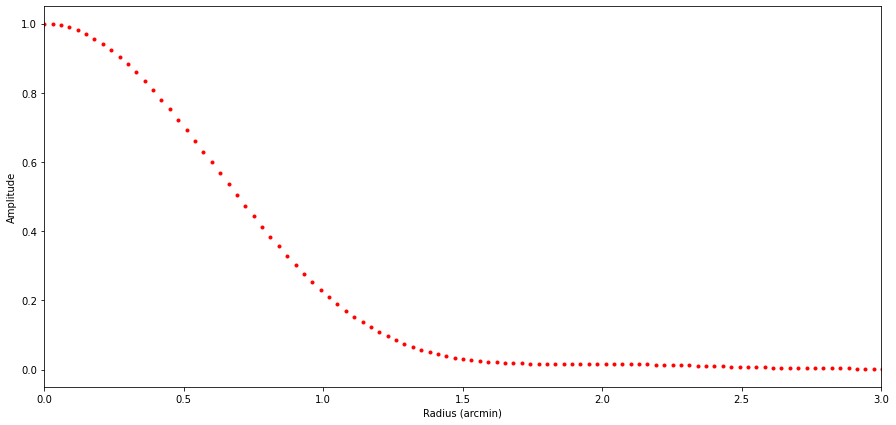

In [6]:
#Para ver detalle por ejemplo pasar desde grados a arcmin y samplear desde 0 hasta 3

theta_arcmin = theta*60.

plt.figure(figsize=(15,7))
plt.xlabel("Radius (arcmin)")
plt.ylabel("Amplitude")
plt.plot(theta_arcmin,beam,"r.")
plt.xlim(0.,3.)


#Notar que la mitad del beam está aproximadamente en 0.7 arcmin, por lo que el fullwidth del beam 
#en 2-d sería 1.4 arcmin approx

(0.0, 0.005)

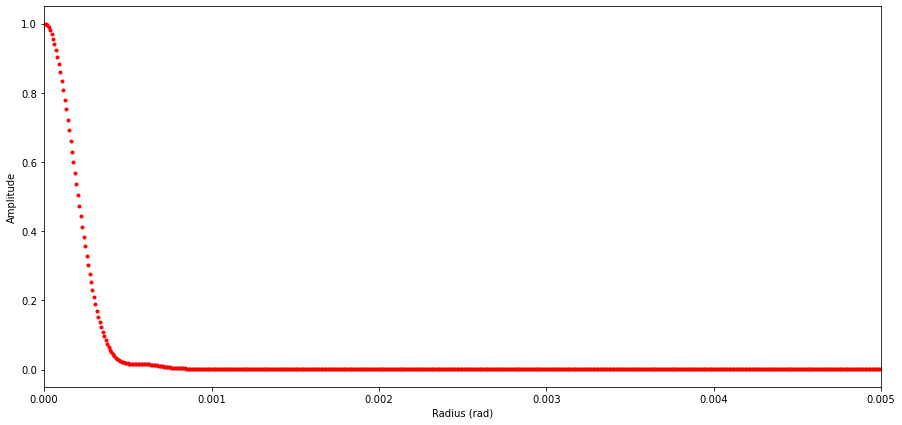

In [7]:
#En radianes

theta_rad = theta*numpy.pi/180.
plt.figure(figsize=(15,7))
plt.xlabel("Radius (rad)")
plt.ylabel("Amplitude")
plt.plot(theta_rad,beam,"r.")
plt.xlim(0.,0.005)

In [8]:
###Espacio de Fourier y Convoluciones #####################################################################################################
#Si la fuente es puntual el Beam anterior la puede representar bien en el mapa, en el caso de Sunyaev-Zeldovich las
#fuentes son extendidas y lo que vemos es la convolución de este beam y el perfil del cumulo, esta convolución es
#la multiplicacion de ambos perfiles en espacio de Fourier 2-d, como trabajamos con perfiles radiales, podemos 
#directamente calcular la transformada de Fourier-2d (esfericamente simetrica o transformada de Hankel) y hacer la 
#multiplicación, esto lo hace la función SymmetricFourierTransform

In [9]:
0.5*scaling*numpy.pi/180. #radian maximo sampleado por el archivo

0.00896136295248123

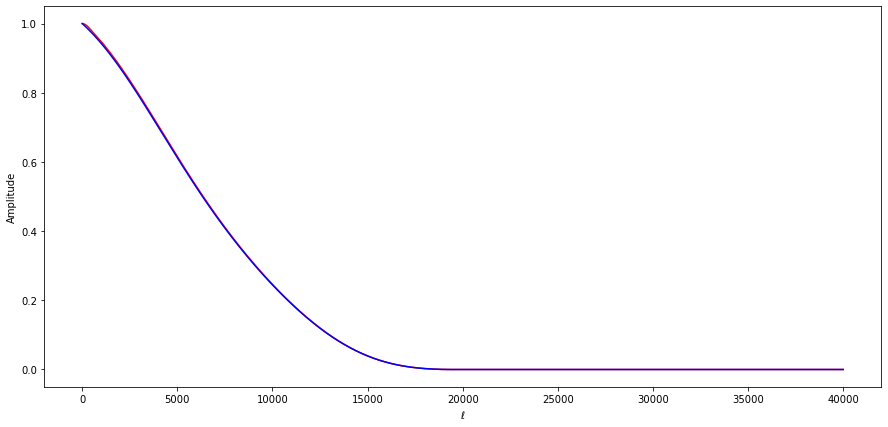

In [10]:
#Generalmente los archivos de Beams contienen tanto el perfil radial en espacio mapa, i.e. Amplitud vs distancia en 
#grados como tambien el perfil en espacio Fourier-2D, Amplitud vs ell (el mismo ell de los Power Spectrum de CMB)
#La función SymmetricFourierTransform pasa el perfil desde espacio mapa a espacio Fourier, esta función nos sirve
#por ejemplo en el caso de querer saber como es el perfil del cumulo en espacio ell

#Comparación de la transformada entregada en los archivos y usar SymmetricFourierTransform
#Para usar SymmetricFourierTransform necesitamos el perfil en radianes por lo que hacemos un scaling adicional

Beam_rad = getBeamProfile(beam_profile_file, factorx = numpy.pi/180.) #Sin scaling para comparar CMB con CMB

Beam_ell = SymmetricFourierTransform(Beam_rad,rmax=0.0089,nbin=10000,inverse=False,ell=True)

#Creamos un espacio en ell
ell = numpy.linspace(0.,40000.,10000)
#Lo proyectamos en la funcion que hace la transformada
B_ell = Beam_ell(ell)
#Y normalizamos
B_ell /= B_ell[0]
#Ojo que B_ell es un array
#Lo podemos plotear como

plt.figure(figsize=(15,7))
plt.xlabel(r"$\ell$")
plt.ylabel("Amplitude")

plt.plot(ell,B_ell,"r-")

#Beam ell desde el archivo.

beam_trans_file = path + beamfolder + "/beam_tform_160201_2014_pa1_jitter_CMB_deep56.txt"

B_trans = getBeamProfile(beam_trans_file)

plt.plot(ell,B_trans(ell),"b-")
plt.show()

El modelo beta es: $\Delta T = \Delta T_0 \left( 1 + \frac{\theta^2}{\theta_c^2}  \right)^{(1-3\beta)/2}$

In [11]:
#En paper antiguos se usaba una funcion beta para representar el perfil de los cumulos de galaxias, ahora en los mas
#nuevos simplemente usan un modelo de Navarro Frenk White, en cualquiera de los dos casos el perfil que se ve en los
#mapas es uno de estos convolucionado con el Beam. Segun el paper de Thobias Marriage de cumulos de ACT un theta tipico 
#es del orden de 1' con beta = 0.86

#https://iopscience.iop.org/article/10.1088/0004-637X/737/2/61/pdf

betafunc = getBetaFunction(1.*numpy.pi/(60.*180.),0.86) #Pasamos directamente a radianes
rad = numpy.linspace(0.,0.0089,10000)

betafunc_ell = SymmetricFourierTransform(betafunc,rmax=0.0089,nbin=50000,inverse=False,ell=True)

ell = numpy.linspace(0.,40000.,10000)

Beta_ell = betafunc_ell(ell)

Beta_ell  /= Beta_ell[0]

conv_spline = spline(ell*(2.*numpy.pi)/(360.*60.),Beta_ell*B_ell,k=5,ext=1)

conv_profile = SymmetricFourierTransform(conv_spline, 60., 10000, inverse=True)

convolvedx = numpy.linspace(0.,60.,10000)
convolvedy = conv_profile(convolvedx)
convolvedy = convolvedy/convolvedy[0]

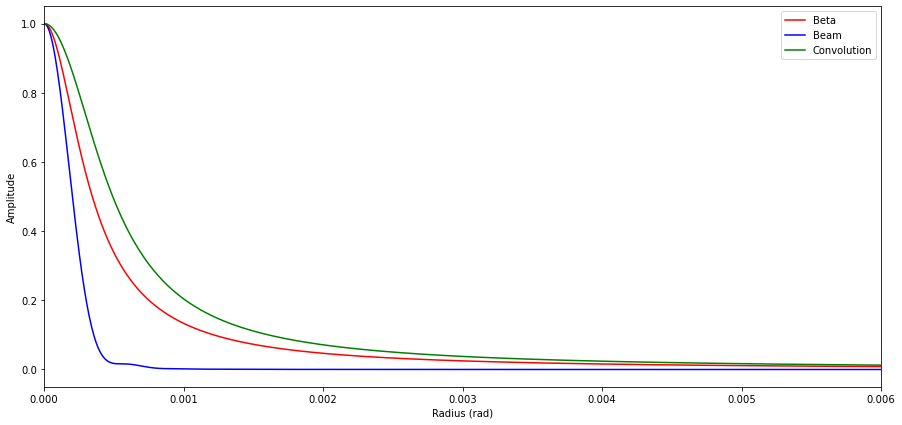

In [12]:
plt.figure(figsize=(15,7))
plt.xlabel("Radius (rad)")
plt.ylabel("Amplitude")

plt.plot(rad,betafunc(rad),"r-", label = "Beta")
plt.plot(theta_rad,beam,"b-",label = "Beam")
plt.plot(convolvedx*numpy.pi/(60.*180.),convolvedy,"g-",label = "Convolution")
plt.xlim(0.,0.006)

plt.legend()

In [13]:
#Tomemos mapas de ACTpol DR3 PA1 S2 (este script deberia funcionar en cualquier mapa)

#4way por ejemplo es cuando se hace un split de una temporada en 4 mapas, lo que es util para construir un modelo de 
#ruido usando los pesos de los mapas (inverse variance) se pueden promediar estos mapas en un 4way-coadd (o 1-way), 
#con una inverse variance que resulta el promedio de las inverse variance individuales

#Los archivos a usar son los siguientes, juntos con sus links de descarga

#ACTPol_148_D56_PA1_S2_1way_I.fits, Deep 56 PA1 Season2 Temperature (I Stokes Parameter)
#Este mapa incluye fuentes extragalacticas 
#https://lambda.gsfc.nasa.gov/data/suborbital/ACT/actpol_2016_maps/ACTPol_148_D56_PA1_S2_1way_I.fits

#ACTPol_148_D56_PA1_S2_1way_I_src_free.fits, Deep 56 PA1 Season2 Temperature (I Stokes Parameter)
#Este no contiene fuentes extragalacticas
#https://lambda.gsfc.nasa.gov/data/suborbital/ACT/actpol_2016_maps/ACTPol_148_D56_PA1_S2_1way_I_src_free.fits

#ACTPol_148_D56_PA1_S2_1way_hits.fits, Los pesos de los mapas
#https://lambda.gsfc.nasa.gov/data/suborbital/ACT/actpol_2016_maps/ACTPol_148_D56_PA1_S2_1way_hits.fits

def eshow(x,**kwargs): 
    ''' Define a function to help us plot the maps neatly '''
    plots = enplot.get_plots(x, **kwargs)
    enplot.show(plots, method = "ipython")

keys = {"downgrade": 3, "ticks": 10, "colorbar": True}

In [14]:
T_D56 = enmap.read_map(path + "ACTPol_148_D56_PA1_S2_1way_I.fits")
T_D56_nsrc = enmap.read_map(path + "ACTPol_148_D56_PA1_S2_1way_I_src_free.fits")
W_D56 = enmap.read_map(path + "ACTPol_148_D56_PA1_S2_1way_hits.fits")

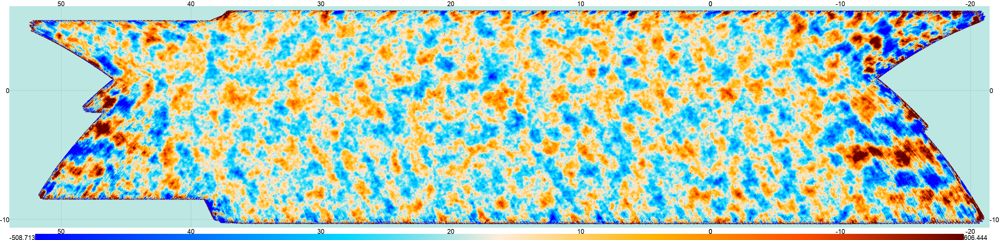

In [15]:
eshow(T_D56, **keys)

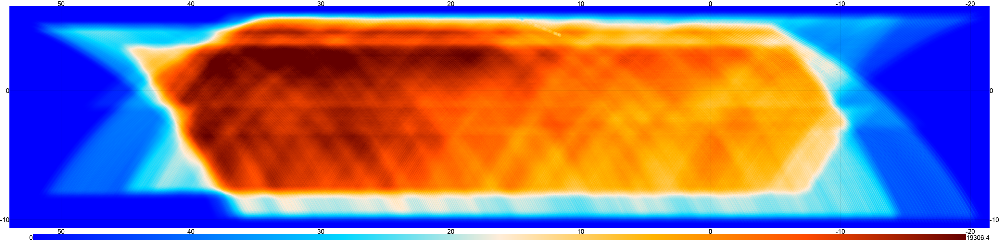

In [16]:
eshow(W_D56, **keys)

In [17]:
#Recortemos una zona centrada en RA = 30.0 DEC = -1.5 de ancho RA = 15. DEC = 8.0
#Pixell usa radianes!!!

ra,dec = numpy.deg2rad([30.0,-1.5])
wra,wdec = numpy.deg2rad([15.0,8.0])

box = [[dec-wdec/2.,ra-wdec/2.],[dec+wdec/2.,ra+wra/2.]]

In [18]:
sT_D56 = enmap.read_fits(path + "ACTPol_148_D56_PA1_S2_1way_I.fits", box = box)

keys = {"downgrade": 2, "ticks": 10, "colorbar": True, "min" : -350., "max" : +350.}

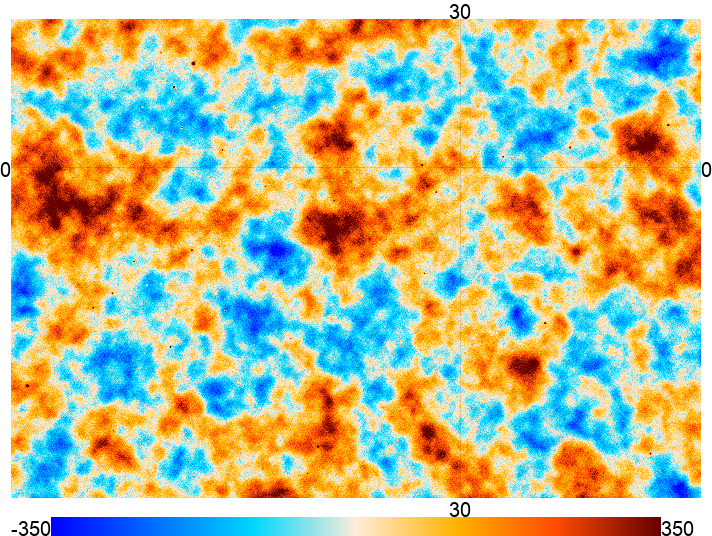

In [19]:
eshow(sT_D56, **keys)

In [20]:
sT_D56_nsrc = enmap.read_fits(path + "ACTPol_148_D56_PA1_S2_1way_I_src_free.fits", box = box)

In [21]:
sW_D56 =  enmap.read_fits(path + "ACTPol_148_D56_PA1_S2_1way_hits.fits", box = box)

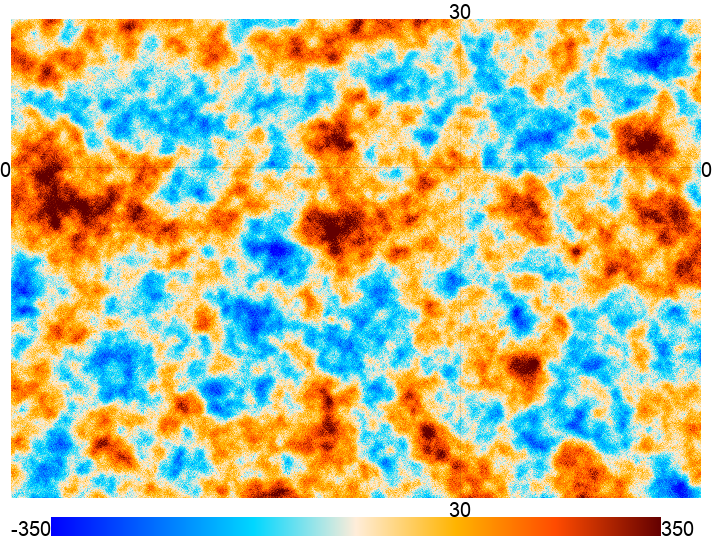

In [22]:
eshow(sT_D56_nsrc, **keys)

El filtro se crea en espacio de Fourier la forma matematica es 	$\Phi_{MF}(\mathrm{\textbf{k}}) = \frac{F_{k_{0}}(\mathrm{\textbf{k}}) \tilde{B}^{*}(\mathrm{\textbf{k}}) |\tilde{T}_\mathrm{other}(\mathrm{\textbf{k}})|^{-2}}{\int{\tilde{B}^{*}(\mathrm{\textbf{k}}') F_{k_{0}}(\mathrm{\textbf{k}}') |\tilde{T}_\mathrm{other}(\mathrm{\textbf{k}}')|^{-2} \tilde{B}(\mathrm{\textbf{k}}') d\mathrm{\textbf{k}}'}}$

donde $\mathrm{\textbf{k}}$ es el numero de onda, $\tilde{B}(\mathrm{\textbf{k}})$ es la transformada de Fourier del Beam, en el caso de un cumulo seria la convolucion del Beam con el perfil del cumulo. $\tilde{T}_\mathrm{other}$ es la transformada de Fourier de la combinacion de todas las señales esperadas además de cúmulos, por ejemplo fuentes puntuales, ruido atmosferico, ruido del detector, CMB, etc... La función $F_{k_{0}}$ representa un high-pass filter, que quita la contribución de multipolos desde $\ell=1200$ hasta $\ell=0$, este se usa para removar escalas muy grandes debido a ruido atmosférico. Una buena estimación del power spectrum de $\tilde{T}_\mathrm{other}$ se puede lograr usando el mapa en si mismo pero con las fuentes más brillantes maskeadas o usando directamente el mapa sin fuentes, esto funciona ya que el residuo del power spectrum de fuentes es mucho más pequeño que el de las otras componentes.

In [23]:
###Construyendo paso a paso el filtro y aplicandolo, la rutina original se encuentra en filterLib

#T_other = noiseMap, lo elegimos por ejemplo como el mapa sin fuentes

noiseMap = sT_D56_nsrc

#Para hacer el ruido plano multiplicamos por la raiz cuadrada de los pesos

noiseMap *= numpy.sqrt(sW_D56)

#Agregamos un taper para suavizar los bordes y asi no tener un mix de potencia en Fourier

apod_pix = 50
taper    = enmap.apod(noiseMap*0+1,apod_pix)

noiseMap *= taper

#Calculamos la transformada 2d o kmap

#kmap_noiseMap = enmap.fft(noiseMap, normalize = 'phys')
kmap_noiseMap = numpy.fft.fft2(noiseMap)

#T_other^2 lo obtenemos multiplicando por el conjugado

T_other2 = numpy.real(kmap_noiseMap * numpy.conjugate(kmap_noiseMap))

#Y le aplicamos un suavizado

gFilterSigma = 10.
smooth = ndimage.gaussian_filter(numpy.fft.fftshift(T_other2), gFilterSigma)
T_other2 = numpy.fft.ifftshift(smooth)

#Usando directamente el beam jitter CMB

beam_ell_file = path + beamfolder + "/beam_tform_160201_2014_pa1_jitter_CMB_deep56.txt"

Beamspl = getBeamSpline(beam_ell_file) #Funcion continua del Beam en espacio ell

#La transformada del mapa esta expresado en numeros de onda kx,ky que tambien se pueden ver como ellx y elly
#como tambien en modulo de ell = sqrt(ellx^2 elly^2), esto ultimo es util para proyectar el Beam, hay una
#metodo que entrega esto en Pixell y es .modlmap

modLMap = noiseMap.modlmap()

#Proyectando el Beam

Beam_kk = Beamspl(modLMap)
Beam_kk /= getBeamNorm(Beam_kk) #El beam esta normalizado en espacio mapa a 1.0

# F_k0,kx
ellyMin = 0.
ellxMin = 0.
ellMin = 1200.

ly, lx = enmap.laxes(noiseMap.shape,noiseMap.wcs)

lmask = numpy.ones(modLMap.shape)
lmask[:, numpy.abs(lx) < ellxMin] = 0.  # vertical strip
lmask[numpy.abs(ly) < ellyMin] = 0.  # horizontal strip
lmask[modLMap < ellMin] = 0.  # low-ell circle

# Filter normalization
Norm = numpy.sum((Beam_kk ** 2) * lmask / T_other2) / Beam_kk.size
kFilter = Beam_kk * lmask / T_other2 / Norm
kFilter = symmetrizeFFT(numpy.asarray(kFilter,dtype=complex))
kFilter = numpy.real(kFilter)


In [24]:
#Aplicando el filtro, al mapa sin fuentes

#data = sT_D56*numpy.sqrt(sW_D56)*taper 
data = noiseMap

filt = kFilter

map_fft = numpy.fft.fft2(data) 
filtmap_fft = map_fft * filt
filtmap = numpy.fft.ifft2(filtmap_fft)
filtmap = numpy.real(filtmap)

#Devolviendo la multiplicacioin por pesos

filtmap /= numpy.sqrt(sW_D56)

fmap = enmap.enmap(filtmap, noiseMap.wcs)

In [25]:
keys = {"downgrade": 2, "ticks": 20, "color":"gray","colorbar": True, "min" : -150., "max" : +150.}

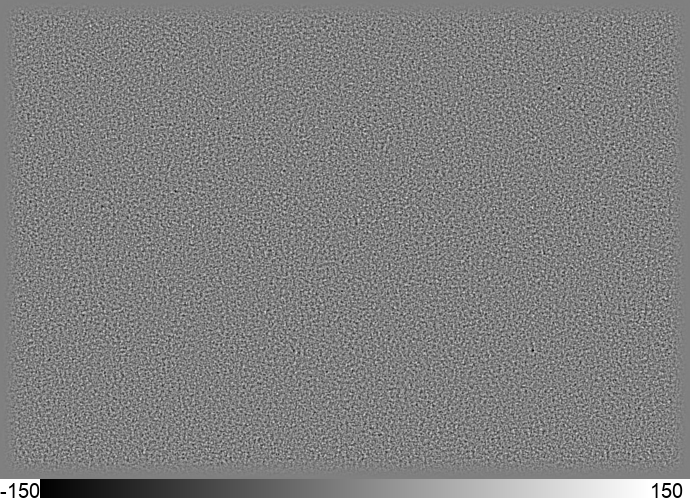

In [26]:
eshow(fmap, **keys)

#Puntos negros notorios son cumulos de galaxias, este filtro no está construido especificamente para cúmulos
#Si es que se usa el perfil de la fuente, el peak multiplicado por el angulo solido da el flujo, si se quiere en
#miliJansky hay que hacer una transformación desde temperatura de CMB a miliJansky, también se puede pasar desde
#temperatura de CMB a Compton y-parameter que es la medición tipica del efecto Sunyaev-Zeldovich

In [27]:
#Aplicando el filtro, al mapa con fuentes

data = sT_D56*numpy.sqrt(sW_D56)*taper 

filt = kFilter

map_fft = numpy.fft.fft2(data) 
filtmap_fft = map_fft * filt
filtmap = numpy.fft.ifft2(filtmap_fft)
filtmap = numpy.real(filtmap)

#Devolviendo la multiplicacioin por pesos

filtmap /= numpy.sqrt(sW_D56)

fmap = enmap.enmap(filtmap, noiseMap.wcs)

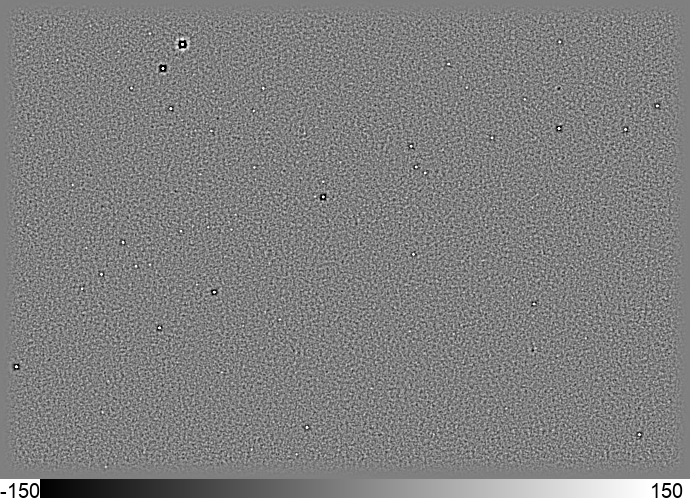

In [28]:
keys = {"downgrade": 2, "ticks": 20, "color":"gray","colorbar": True, "min" : -150., "max" : +150.}
eshow(fmap, **keys)

#Algunas fuentes extragalacticas (puntos blancos) son muy fuertes que incluyen distorsiones que pueden afectar a los 
#cumulos de galaxias es por esto que es mejor usar el mapa que tiene fuentes sustraidas